In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
np.random.seed(5)

sns.set(rc={'figure.figsize': (16, 16)})
sns.set_style('whitegrid')
sns.set_context('paper',font_scale=1.5)

df = pd.read_csv('../data/aqsoldb.csv')
df.head()

,ID,Name,InChI,InChIKey,SMILES,Solubility,SD,Ocurrences,Group,MolWt,...,NumRotatableBonds,NumValenceElectrons,NumAromaticRings,NumSaturatedRings,NumAliphaticRings,RingCount,TPSA,LabuteASA,BalabanJ,BertzCT
0,A-3,"N,N,N-trimethyloctadecan-1-aminium bromide",InChI=1S/C21H46N.BrH/c1-5-6-7-8-9-10-11-12-13-...,SZEMGTQCPRNXEG-UHFFFAOYSA-M,[Br-].CCCCCCCCCCCCCCCCCC[N+](C)(C)C,-3.616127,0.0,1,G1,392.510,...,17.0,142.0,0.0,0.0,0.0,0.0,0.00,158.520601,0.000000e+00,210.377334
1,A-4,Benzo[cd]indol-2(1H)-one,InChI=1S/C11H7NO/c13-11-8-5-1-3-7-4-2-6-9(12-1...,GPYLCFQEKPUWLD-UHFFFAOYSA-N,O=C1Nc2cccc3cccc1c23,-3.254767,0.0,1,G1,169.183,...,0.0,62.0,2.0,0.0,1.0,3.0,29.10,75.183563,2.582996e+00,511.229248
2,A-5,4-chlorobenzaldehyde,InChI=1S/C7H5ClO/c8-7-3-1-6(5-9)2-4-7/h1-5H,AVPYQKSLYISFPO-UHFFFAOYSA-N,Clc1ccc(C=O)cc1,-2.177078,0.0,1,G1,140.569,...,1.0,46.0,1.0,0.0,0.0,1.0,17.07,58.261134,3.009782e+00,202.661065
3,A-8,"zinc bis[2-hydroxy-3,5-bis(1-phenylethyl)benzo...",InChI=1S/2C23H22O3.Zn/c2*1-15(17-9-5-3-6-10-17...,XTUPUYCJWKHGSW-UHFFFAOYSA-L,[Zn++].CC(c1ccccc1)c2cc(C(C)c3ccccc3)c(O)c(c2)...,-3.924409,0.0,1,G1,756.226,...,10.0,264.0,6.0,0.0,0.0,6.0,120.72,323.755434,2.322963e-07,1964.648666
4,A-9,4-({4-[bis(oxiran-2-ylmethyl)amino]phenyl}meth...,InChI=1S/C25H30N2O4/c1-5-20(26(10-22-14-28-22)...,FAUAZXVRLVIARB-UHFFFAOYSA-N,C1OC1CN(CC2CO2)c3ccc(Cc4ccc(cc4)N(CC5CO5)CC6CO...,-4.662065,0.0,1,G1,422.525,...,12.0,164.0,2.0,4.0,4.0,6.0,56.60,183.183268,1.084427e+00,769.899934


In [3]:
df.columns, 'len: '+str(len(df.columns))

(Index(['ID', 'Name', 'InChI', 'InChIKey', 'SMILES', 'Solubility', 'SD',
        'Ocurrences', 'Group', 'MolWt', 'MolLogP', 'MolMR', 'HeavyAtomCount',
        'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds',
        'NumValenceElectrons', 'NumAromaticRings', 'NumSaturatedRings',
        'NumAliphaticRings', 'RingCount', 'TPSA', 'LabuteASA', 'BalabanJ',
        'BertzCT', 'processed_smiles', 'class'],
       dtype='object'),
 'len: 28')

In [5]:
numeric_df = df.select_dtypes(include=[np.number])


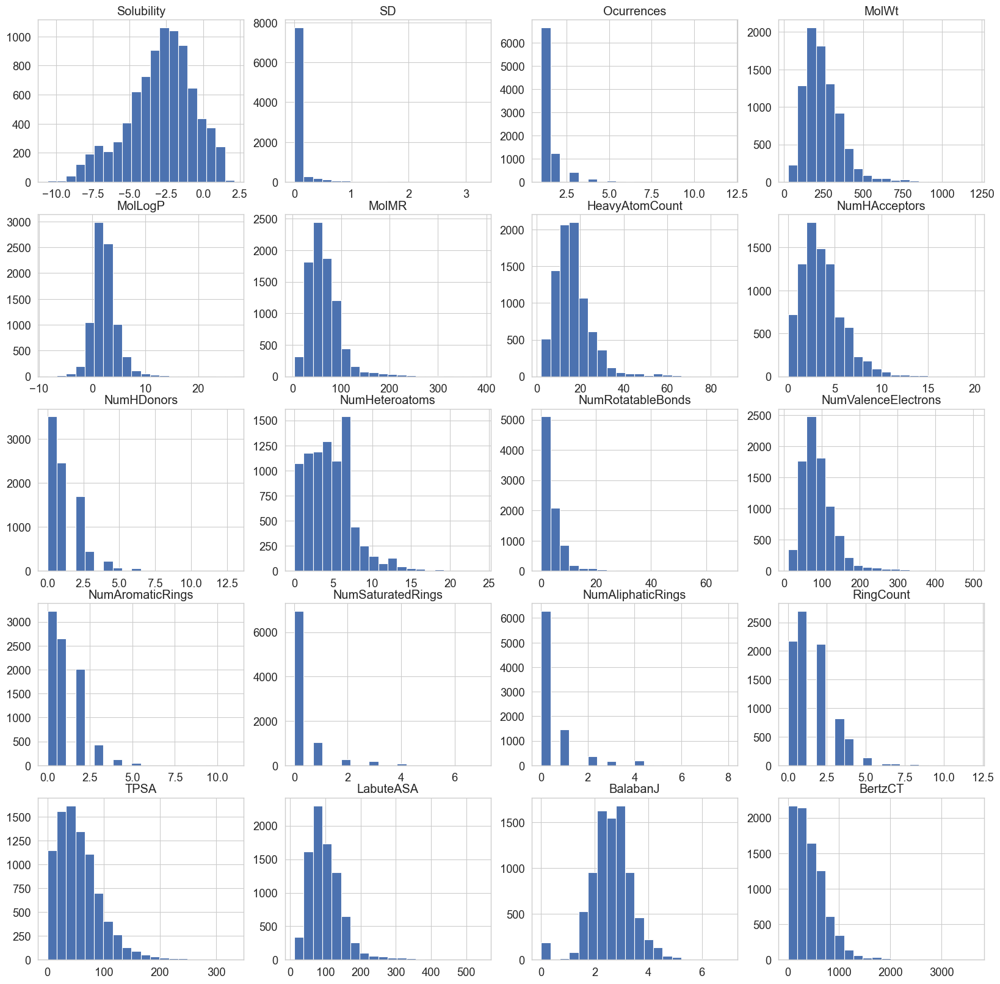

In [5]:
pl, ax = plt.subplots(5, 4, figsize=(20, 20))
for i, col in enumerate(numeric_df.columns):
	c = numeric_df[col]
	ax[i // 4, i % 4].hist(c, bins=20)
	ax[i // 4, i % 4].set_title(col)

plt.show()

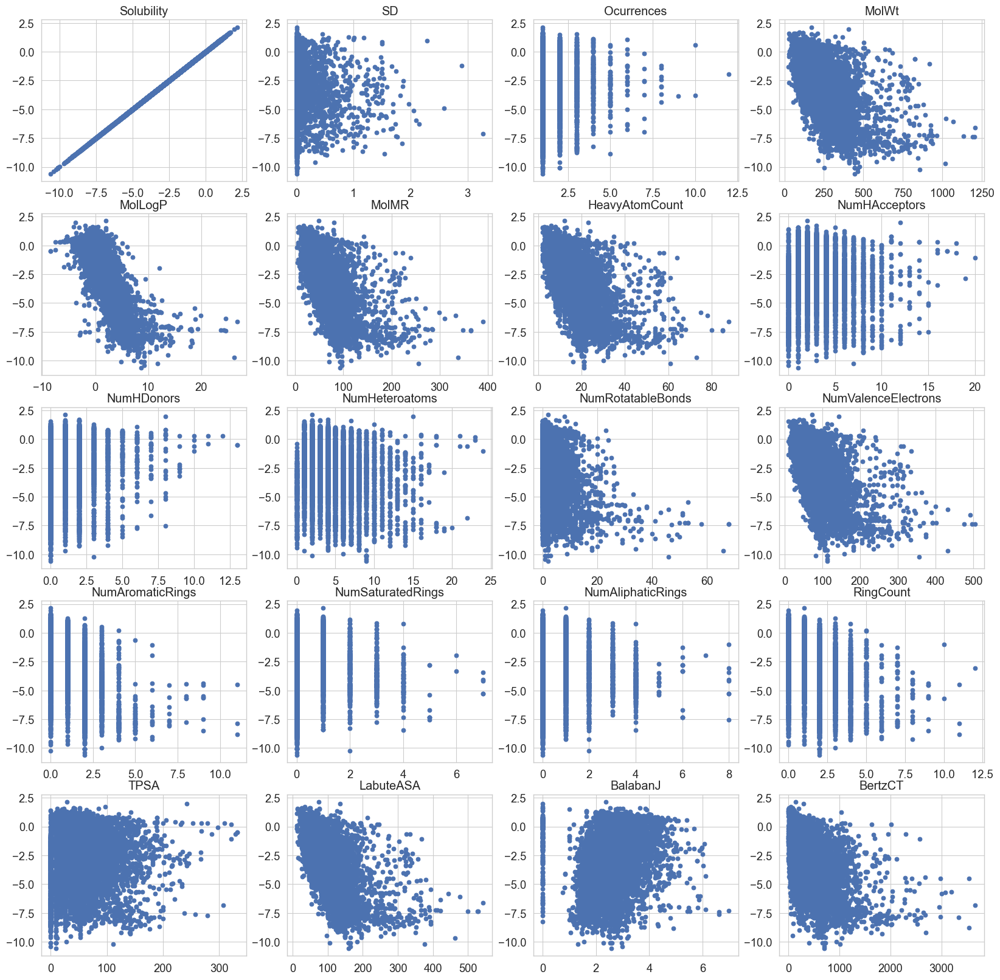

In [6]:
pl, ax = plt.subplots(5, 4, figsize=(20, 20))
for i, col in enumerate(numeric_df.columns):
	ax[i // 4, i % 4].scatter(numeric_df[col], df["Solubility"])
	ax[i // 4, i % 4].set_title(col)

plt.show()

In [7]:
df['class'] = None
df.loc[df['Solubility']>0.0, 'class'] = 'highly soluble'


df.loc[(df['Solubility']>-2) & (df['Solubility']<=0), 'class'] = 'soluble'

df.loc[(df['Solubility']>-4.0) & (df['Solubility']<=-2.0), 'class'] = 'slightly soluble'

df.loc[df['Solubility']<=-4.0, 'class'] = 'insoluble'

counts = df.groupby(['Group','class'])['ID'].count().reset_index()
counts

,Group,class,ID
0,G1,highly soluble,605
1,G1,insoluble,1837
2,G1,slightly soluble,2322
3,G1,soluble,1884
4,G2,highly soluble,11
5,G2,insoluble,103
6,G2,slightly soluble,50
7,G2,soluble,29
8,G3,highly soluble,90
9,G3,insoluble,276


<Axes: xlabel='Group', ylabel='ID'>

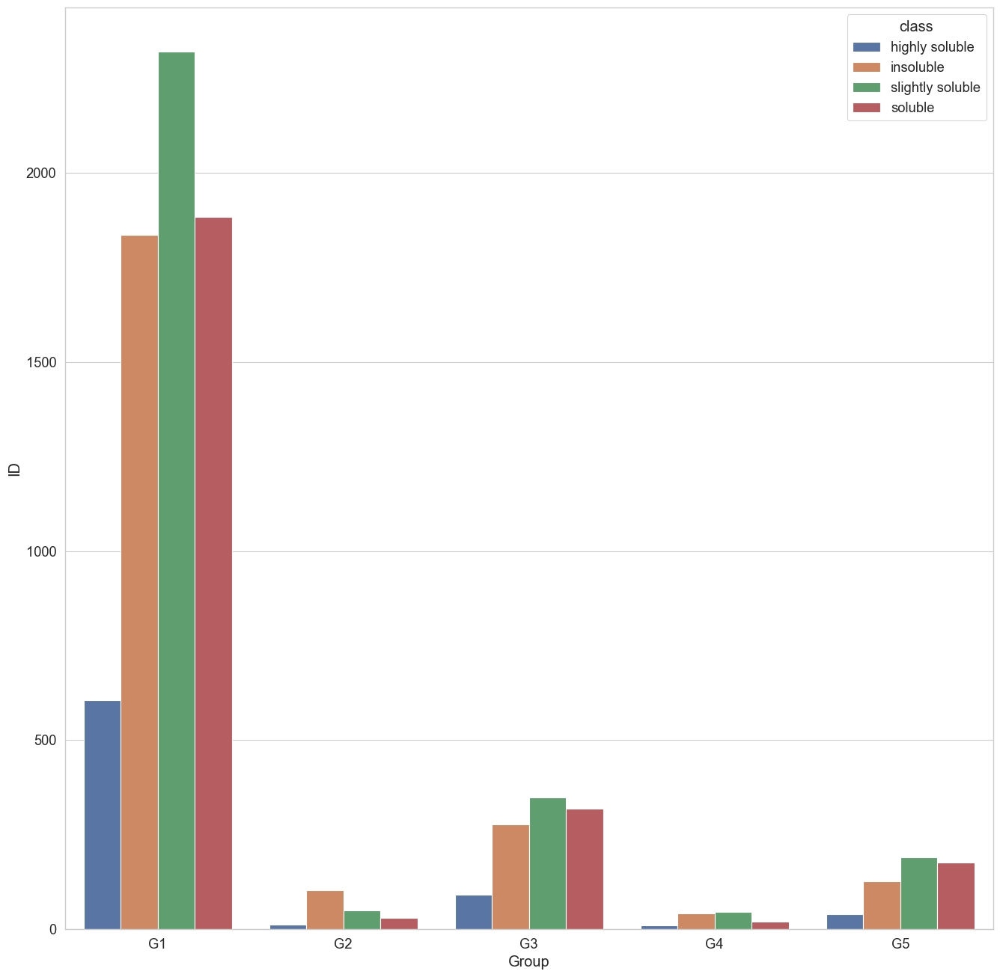

In [8]:
sns.barplot(x='Group', y='ID', data=counts, hue='class', errorbar=('ci', 95))

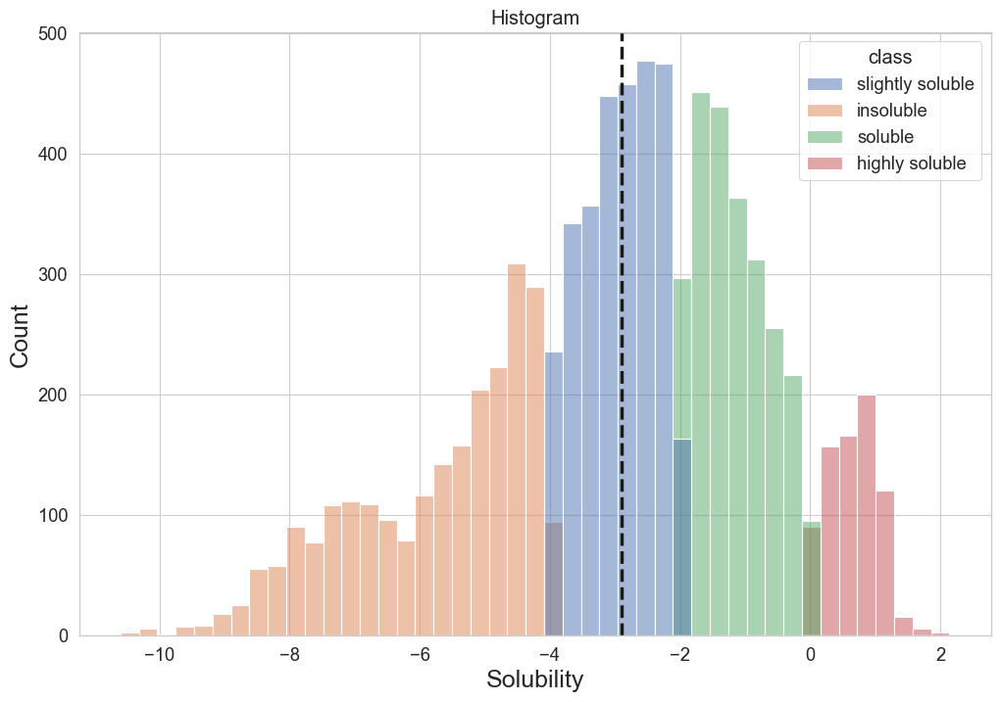

In [9]:
fig, ax = plt.subplots(figsize=(12, 8))

sns.set_context(font_scale=2)
sns.histplot(x='Solubility', data=df, hue='class', ax=ax)

ax.axvline(df['Solubility'].mean(), color='k', linestyle='dashed', linewidth=2.5)

ax.set_title('Histogram')
ax.set_ylabel('Count', fontsize=18)
ax.set_xlabel('Solubility', fontsize=18)

plt.show()

In [6]:
from scipy import stats

outlier_std = 3

#creates a df with normal and outliers labeled in new column
numerical_outliers_df = numeric_df.copy()
numerical_outliers_df['Outliers'] = np.where((np.abs(stats.zscore(numerical_outliers_df)) > outlier_std).any(axis=1), 'Outliers', 'Normal')

#creates df of outliers only
outlier_df = numeric_df[(np.abs(stats.zscore(numeric_df)) > outlier_std).all(axis=1)]

#creates df of normal data only
normal_numeric_df = numeric_df[(np.abs(stats.zscore(numeric_df)) < outlier_std).all(axis=1)]

#shows the number of normal vs outliers
numerical_outliers_df['Outliers'].value_counts()

Normal      8673
Outliers    1309
Name: Outliers, dtype: int64

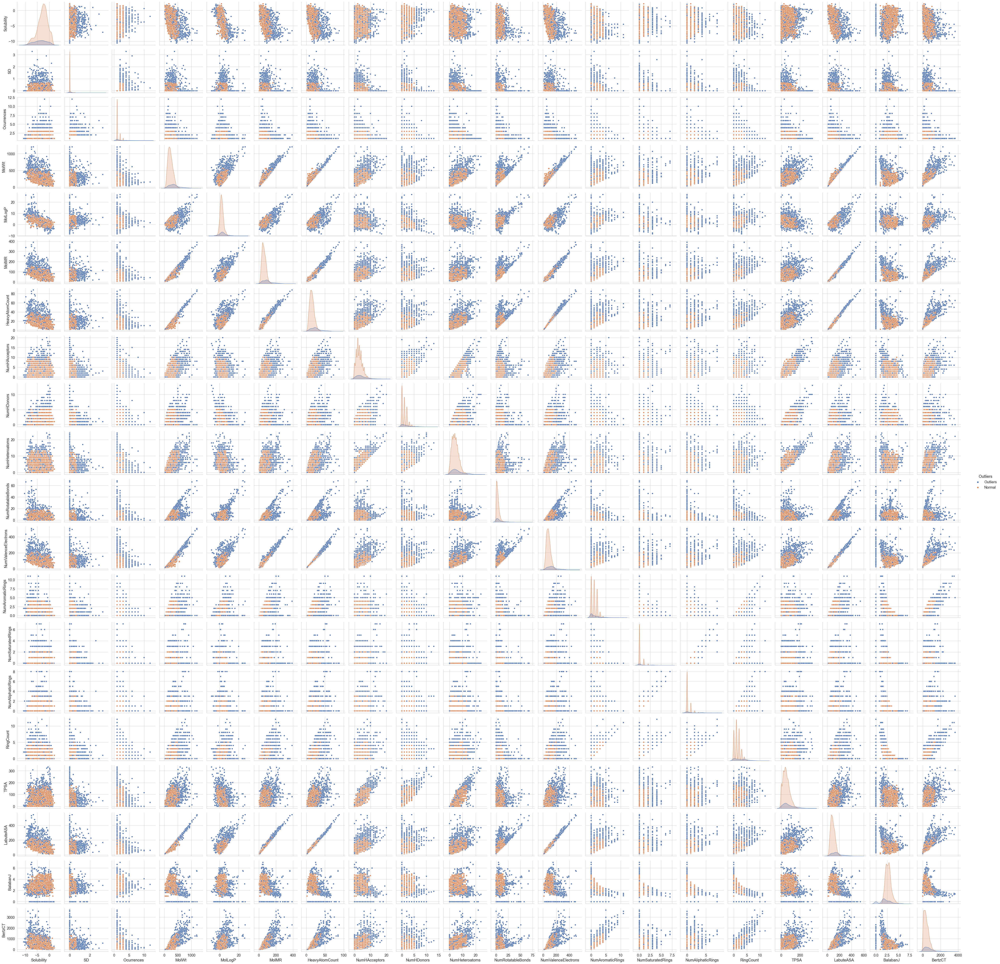

In [11]:
#show outliers on pairplot
sns.pairplot(numerical_outliers_df, hue='Outliers')

array([[<Axes: title={'center': 'Solubility'}>,
        <Axes: title={'center': 'SD'}>,
        <Axes: title={'center': 'Ocurrences'}>,
        <Axes: title={'center': 'MolWt'}>],
       [<Axes: title={'center': 'MolLogP'}>,
        <Axes: title={'center': 'MolMR'}>,
        <Axes: title={'center': 'HeavyAtomCount'}>,
        <Axes: title={'center': 'NumHAcceptors'}>],
       [<Axes: title={'center': 'NumHDonors'}>,
        <Axes: title={'center': 'NumHeteroatoms'}>,
        <Axes: title={'center': 'NumRotatableBonds'}>,
        <Axes: title={'center': 'NumValenceElectrons'}>],
       [<Axes: title={'center': 'NumAromaticRings'}>,
        <Axes: title={'center': 'NumSaturatedRings'}>,
        <Axes: title={'center': 'NumAliphaticRings'}>,
        <Axes: title={'center': 'RingCount'}>],
       [<Axes: title={'center': 'TPSA'}>,
        <Axes: title={'center': 'LabuteASA'}>,
        <Axes: title={'center': 'BalabanJ'}>,
        <Axes: title={'center': 'BertzCT'}>]], dtype=object)

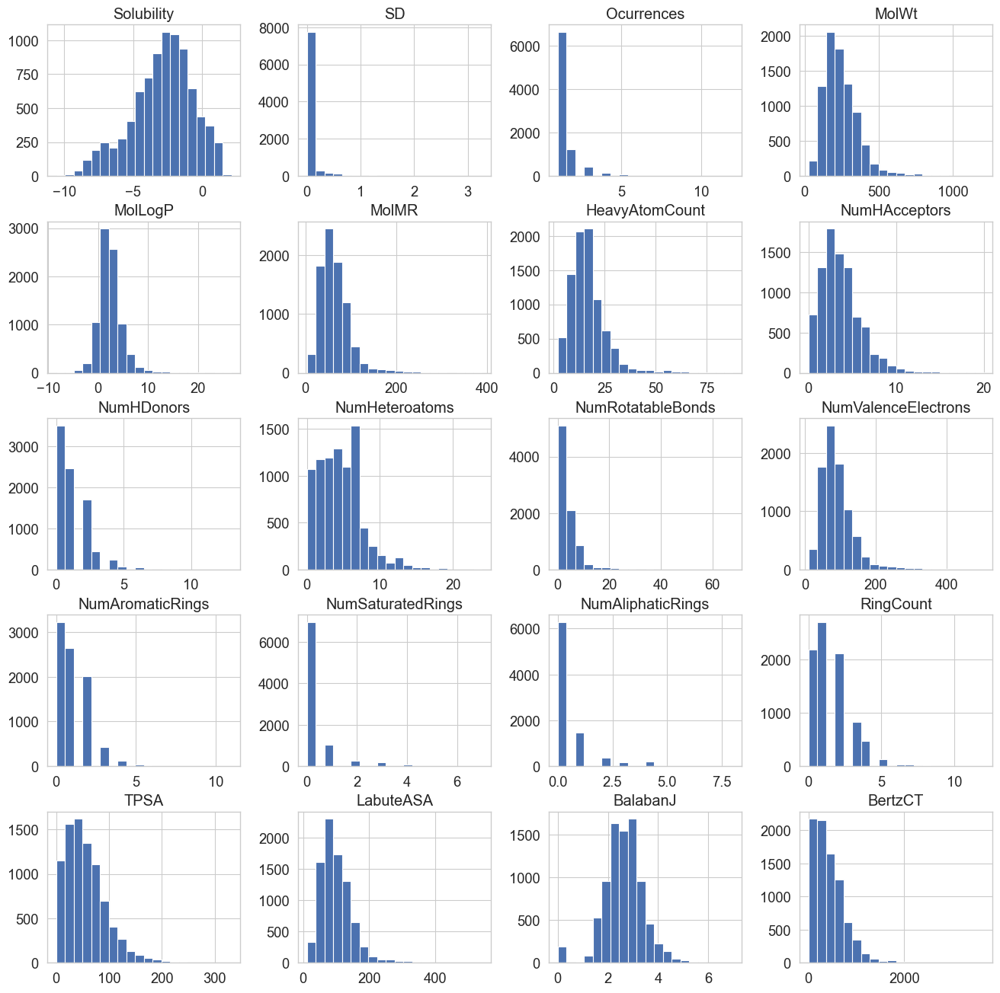

In [12]:

numeric_df.hist(bins=20)

array([[<Axes: title={'center': 'Solubility'}>,
        <Axes: title={'center': 'SD'}>,
        <Axes: title={'center': 'Ocurrences'}>,
        <Axes: title={'center': 'MolWt'}>],
       [<Axes: title={'center': 'MolLogP'}>,
        <Axes: title={'center': 'MolMR'}>,
        <Axes: title={'center': 'HeavyAtomCount'}>,
        <Axes: title={'center': 'NumHAcceptors'}>],
       [<Axes: title={'center': 'NumHDonors'}>,
        <Axes: title={'center': 'NumHeteroatoms'}>,
        <Axes: title={'center': 'NumRotatableBonds'}>,
        <Axes: title={'center': 'NumValenceElectrons'}>],
       [<Axes: title={'center': 'NumAromaticRings'}>,
        <Axes: title={'center': 'NumSaturatedRings'}>,
        <Axes: title={'center': 'NumAliphaticRings'}>,
        <Axes: title={'center': 'RingCount'}>],
       [<Axes: title={'center': 'TPSA'}>,
        <Axes: title={'center': 'LabuteASA'}>,
        <Axes: title={'center': 'BalabanJ'}>,
        <Axes: title={'center': 'BertzCT'}>]], dtype=object)

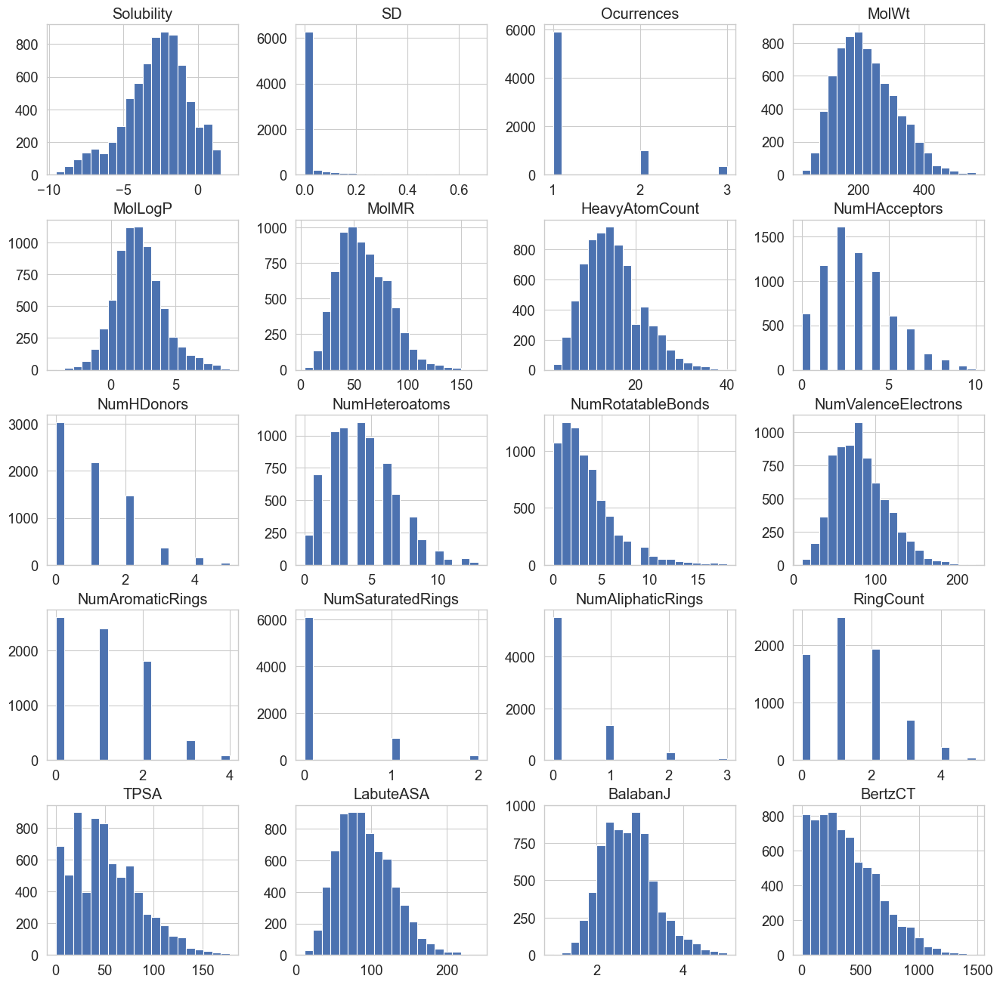

In [13]:
normal_numeric_df.hist(bins=20)